# Bài tập thực hành môn Phân tích và xử lý ảnh 03

# MSSV: 18110014, Họ tên: Nguyễn Phú Thành

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
import os

In [2]:
class Image:
    
    def __init__(self, imgName = None, img = None):
        self.image = img if imgName is None else plt.imread(imgName)
        self.shape = self.image.shape
        self.width, self.height = self.shape[:2]
        self.channel = len(self.shape)
    
    def __add__(self, other):
        return Image(img = (self.image + other.image))
    
    def convertColor(self, cv2ColorConverter):
        return Image(img = cv2.cvtColor(self.image, cv2ColorConverter))
    
    def segmentByMask(self, mask):
        mask = Image(img = mask.image.astype(np.uint8))
        result = cv2.bitwise_and(self.image, self.image, mask = mask.image)
        return Image(img = result)
    
    def applyKernel(self, kernel):
        return Image(img = cv2.filter2D(self.image.copy(), -1, kernel))
    
    def putText(self, text, pos, **kwargs):
        textImg = self.image.copy()
        return Image(
            img = cv2.putText(
                textImg, 
                text, 
                pos, 
                fontFace = kwargs.get('font', cv2.FONT_HERSHEY_SIMPLEX),
                fontScale = kwargs.get('fontScale', 1),
                color = kwargs.get('color', (255, 0, 0)),
                thickness = kwargs.get('thickness', 2)
            )
        )
    @staticmethod
    def blurryMeasurement(data):
        return cv2.Laplacian(data.image, cv2.CV_64F).var()
    # Hàm đọc ảnh trong thư mục, sử dụng trong bài 3
    @staticmethod
    def fromDirectory(drtr, extension = '.jpg'):
        currentDirectory = os.getcwd()
        # Go to drtr directory
        os.chdir(drtr)
        listImages = []
        for file in os.listdir():
            if file.endswith(extension):
                listImages.append(Image(file))
        # Go back to current directory
        os.chdir(currentDirectory)
        return listImages
    # Hàm lưu danh sách các ảnh trong thư mục, sử dụng trong bài 3
    @staticmethod
    def toDirectory(destination, listImages, extension = '.jpg'):
        # If destination directory doesn't exist then create a new directory
        if not os.path.isdir(destination):
            os.mkdir(destination)
        currentDirectory = os.getcwd()
        # Go to destionation directory
        os.chdir(destination)
        for i, image in enumerate(listImages):
            writeImage = image.convertColor(cv2.COLOR_RGB2BGR)
            cv2.imwrite(f'{i}{extension}', writeImage.image)
        # Go back current directory
        os.chdir(currentDirectory)

In [3]:
def imShows(Images, Labels = None, rows = 1, cols = 1):
    imagesArray = list(Images)
    labelsArray = [f"Image {i + 1}" for i in range(len(imagesArray))] if Labels is None else list(Labels)
    figsize = (20, 20) if ((rows == 1) and (cols == 1)) else (cols * 8, rows * 5)
    fig = plt.figure(figsize = figsize)
    for i in range(1, rows * cols + 1):
        ax = fig.add_subplot(rows, cols, i)
        image = imagesArray[i - 1].image
        cmap = plt.cm.gray if (imagesArray[i - 1].channel < 3) else None
        ax.imshow(image, cmap = cmap)
        ax.set(title = labelsArray[i - 1], xticks = [], yticks = [])
    plt.show()

def showThreeImages(IM1, IM2, IM3):
    imShows([IM1, IM2, IM3], rows = 1, cols = 3)
def showTwoImages(IM1, IM2):
    imShows([IM1, IM2], rows = 1, cols = 2)
def showOneImage(IM1):
    imShows([IM1])
def showListImages(listImage, rows, cols):
    imShows(listImage, rows = rows, cols = cols)

# Bài tập 01

#  -  Làm mờ ảnh với các kernel 3x3 và 5x5

In [4]:
image_color = Image('bus.jpg')
image_gray = image_color.convertColor(cv2.COLOR_RGB2GRAY)

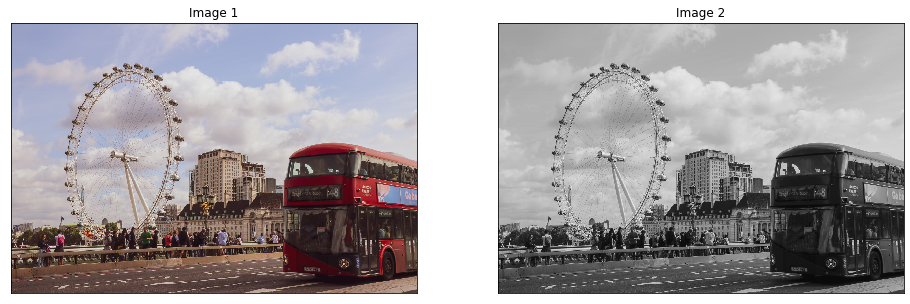

In [5]:
showTwoImages(image_color, image_gray)

In [6]:
def getMeanKernel(shape):
    const = shape[0] * shape[1]
    return np.ones(shape) * 1/(const)

>> Filter image with kernel 3x3: 
[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]
>> Filter image with kernel 5x5: 
[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


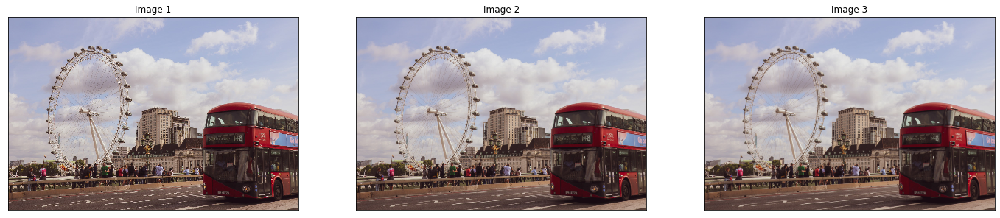

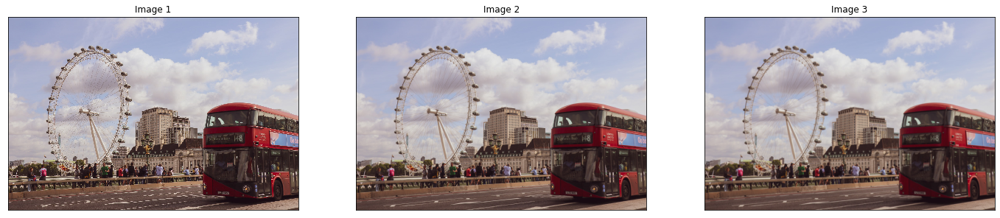

In [7]:
kernel_3x3 = getMeanKernel((3,3))
kernel_5x5 = getMeanKernel((5,5))
print('>> Filter image with kernel 3x3: ')
print(kernel_3x3)
print('>> Filter image with kernel 5x5: ')
print(kernel_5x5)

filter_3x3 = [image_color]
filter_5x5 = [image_color]
loops = 2

for i in range(loops):
    next_blurred_3x3 = filter_3x3[-1].applyKernel(kernel_3x3)
    next_blurred_5x5 = filter_5x5[-1].applyKernel(kernel_5x5)
    filter_3x3.append(next_blurred_3x3)
    filter_5x5.append(next_blurred_5x5)

showListImages(filter_3x3, rows = 1, cols = loops + 1)
showListImages(filter_5x5, rows = 1, cols = loops + 1)

# - Xuất giá trị đo mức độ mờ

In [8]:
blur_measurement_3x3 = []
for i, blurr_img in enumerate(filter_3x3):
    blur_measurement = Image.blurryMeasurement(blurr_img)
    blur_measurement_3x3.append(blur_measurement)
    print(f'Blurred measurement of {i + 1} image: {blur_measurement}')

Blurred measurement of 1 image: 702.6448905465294
Blurred measurement of 2 image: 64.56217811535596
Blurred measurement of 3 image: 22.749911697208404


In [9]:
blur_measurement_5x5 = []
for i, blurr_img in enumerate(filter_5x5):
    blur_measurement = Image.blurryMeasurement(blurr_img)
    blur_measurement_5x5.append(blur_measurement)
    print(f'Blurred measurement of {i + 1} image: {blur_measurement}')

Blurred measurement of 1 image: 702.6448905465294
Blurred measurement of 2 image: 19.824471824635403
Blurred measurement of 3 image: 4.731175265376935


# - Viết dòng thông tin về giá trị mức độ mờ trên ảnh

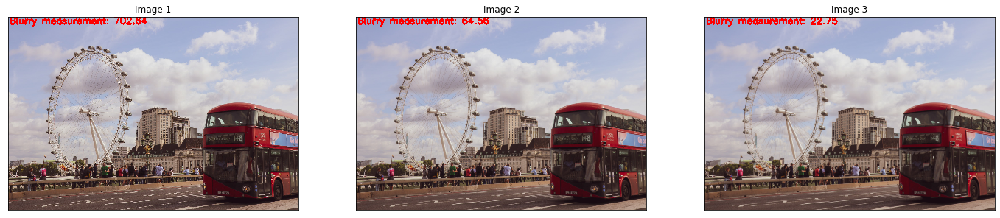

In [10]:
text = 'Blurry measurement'
text_filter = []
for i in range(len(filter_3x3)):
    fm = blur_measurement_3x3[i]
    filter_text = filter_3x3[i].putText('{}: {:.2f}'.format(text, fm), (10, 50), 
                                        fontFace = cv2.FONT_HERSHEY_SIMPLEX, 
                                        fontScale = 2, 
                                        color = (255, 0, 0), 
                                        thickness = 10
                                       )
    text_filter.append(filter_text)
showListImages(text_filter, rows = 1, cols = 3)

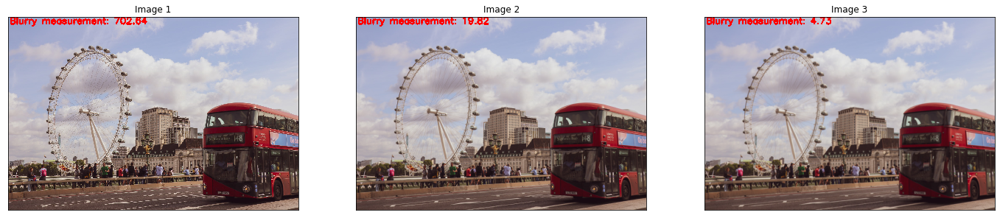

In [11]:
text = 'Blurry measurement'
text_filter = []
for i in range(len(filter_5x5)):
    fm = blur_measurement_5x5[i]
    filter_text = filter_5x5[i].putText('{}: {:.2f}'.format(text, fm), (10, 50), 
                                        fontFace = cv2.FONT_HERSHEY_SIMPLEX, 
                                        fontScale = 2, 
                                        color = (255, 0, 0), 
                                        thickness = 10
                                       )
    text_filter.append(filter_text)
showListImages(text_filter, rows = 1, cols = 3)

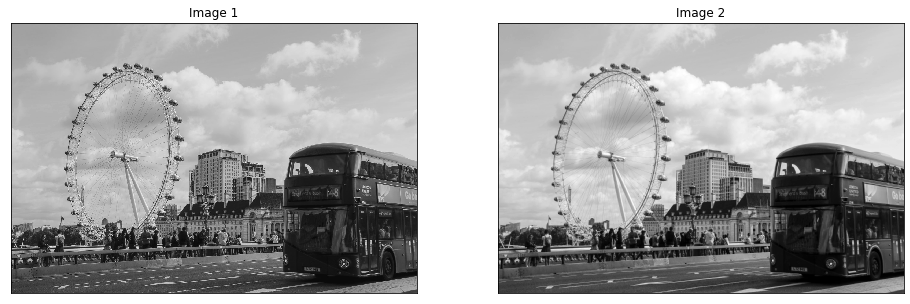

Blur Measurement of image_gray: 698.2481207974745
Blur Measurement of image_gray_filter: 698.2481207974745


In [12]:
image_gray_filter = image_gray.applyKernel(kernel_5x5)

showTwoImages(image_gray, image_gray_filter)
print("Blur Measurement of image_gray:", Image.blurryMeasurement(image_gray))
print("Blur Measurement of image_gray_filter:", Image.blurryMeasurement(image_gray))

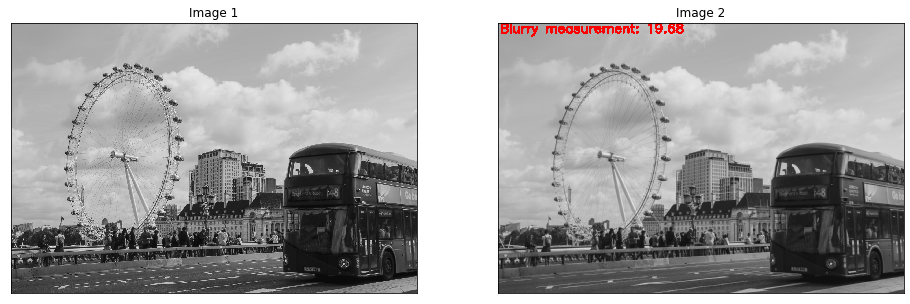

In [13]:
image_gray_filter_color = image_gray_filter.convertColor(cv2.COLOR_GRAY2RGB)

text = "Blurry measurement"
fm = Image.blurryMeasurement(image_gray_filter)
image_gray_filter_color = image_gray_filter_color.putText(
    '{}: {:.2f}'.format(text, fm), (10, 50), 
    fontFace = cv2.FONT_HERSHEY_SIMPLEX, 
    fontScale = 2,
    color = (255, 0, 0), 
    thickness = 10)
showTwoImages(image_gray, image_gray_filter_color)

# Bài tập 02

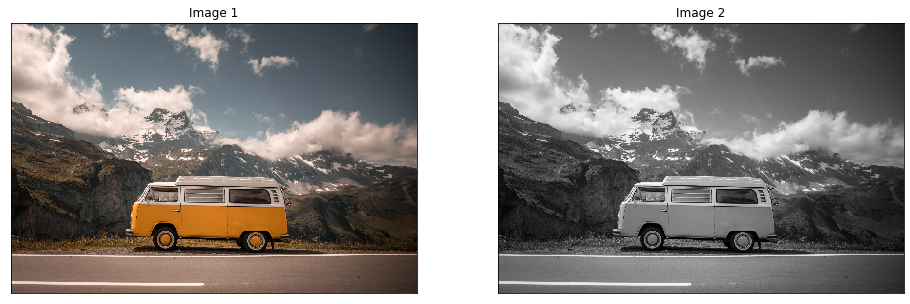

In [14]:
image_color = Image('van.jpg')
image_gray = image_color.convertColor(cv2.COLOR_RGB2GRAY)

showTwoImages(image_color, image_gray)

# - Làm rõ ảnh với các kernel 3x3 và 5x5

>> Sharpened kernel 3x3:
 [[-0.11111111 -0.11111111 -0.11111111]
 [-0.11111111  1.88888889 -0.11111111]
 [-0.11111111 -0.11111111 -0.11111111]]
>> Sharpened kernel 5x5:
 [[-0.04 -0.04 -0.04 -0.04 -0.04]
 [-0.04 -0.04 -0.04 -0.04 -0.04]
 [-0.04 -0.04  1.96 -0.04 -0.04]
 [-0.04 -0.04 -0.04 -0.04 -0.04]
 [-0.04 -0.04 -0.04 -0.04 -0.04]]


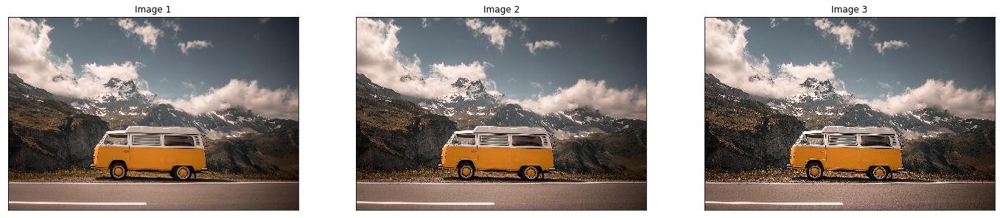

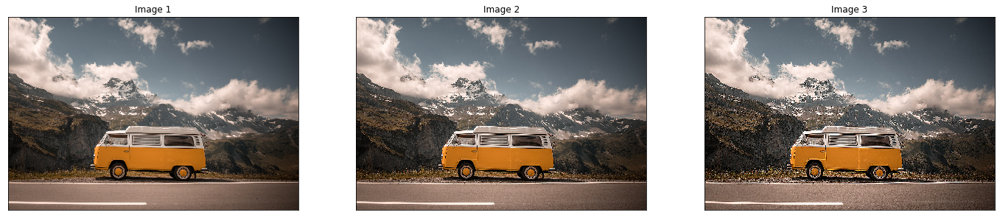

In [15]:
kernel_sharpen_3x3 = np.zeros((3,3))
kernel_sharpen_3x3[1,1] = 2
kernel_sharpen_3x3 = kernel_sharpen_3x3 - getMeanKernel((3,3))

kernel_sharpen_5x5 = np.zeros((5,5))
kernel_sharpen_5x5[2,2] = 2
kernel_sharpen_5x5 = kernel_sharpen_5x5 - getMeanKernel((5,5))

print(f'>> Sharpened kernel 3x3:\n {kernel_sharpen_3x3}')
print(f'>> Sharpened kernel 5x5:\n {kernel_sharpen_5x5}')

enhanced_3x3 = [image_color]
enhanced_5x5 = [image_color]
loops = 2

for i in range(loops):
    next_enhanced_3x3 = enhanced_3x3[-1].applyKernel(kernel_sharpen_3x3)
    next_enhanced_5x5 = enhanced_5x5[-1].applyKernel(kernel_sharpen_5x5)
    enhanced_3x3.append(next_enhanced_3x3)
    enhanced_5x5.append(next_enhanced_5x5)

showListImages(enhanced_3x3, rows = 1, cols = loops + 1)
showListImages(enhanced_5x5, rows = 1, cols = loops + 1)

# - Xuất giá trị đo mức độ rõ

In [16]:
enhanced_measurement_3x3 = []
for i, enhanced_img in enumerate(enhanced_3x3):
    blur_measurement = Image.blurryMeasurement(enhanced_img)
    enhanced_measurement_3x3.append(blur_measurement)
    print(f'Blurred measurement of {i + 1} image: {blur_measurement}')

Blurred measurement of 1 image: 274.5518594305567
Blurred measurement of 2 image: 893.9864937332987
Blurred measurement of 3 image: 2795.3474720143163


In [17]:
enhanced_measurement_5x5 = []
for i, enhanced_img in enumerate(enhanced_5x5):
    blur_measurement = Image.blurryMeasurement(enhanced_img)
    enhanced_measurement_5x5.append(blur_measurement)
    print(f'Blurred measurement of {i + 1} image: {blur_measurement}')

Blurred measurement of 1 image: 274.5518594305567
Blurred measurement of 2 image: 1037.715426040847
Blurred measurement of 3 image: 3269.906323566303


# - Viết dòng thông tin về giá trị mức độ rõ trên ảnh

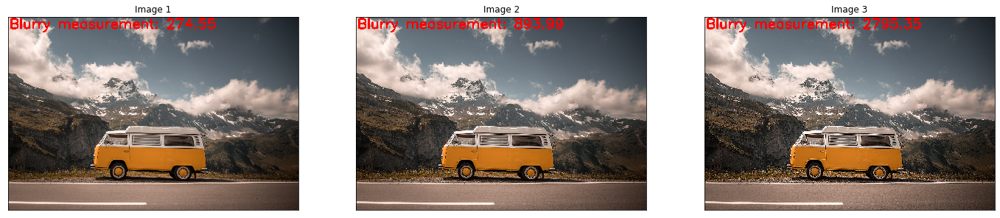

In [18]:
text = 'Blurry measurement'
text_filter = []
for i in range(len(enhanced_3x3)):
    fm = enhanced_measurement_3x3[i]
    filter_text = enhanced_3x3[i].putText('{}: {:.2f}'.format(text, fm), (10, 80), 
                                        fontFace = cv2.FONT_HERSHEY_SIMPLEX, 
                                        fontScale = 3, 
                                        color = (255, 0, 0), 
                                        thickness = 10
                                       )
    text_filter.append(filter_text)
showListImages(text_filter, rows = 1, cols = len(enhanced_3x3))

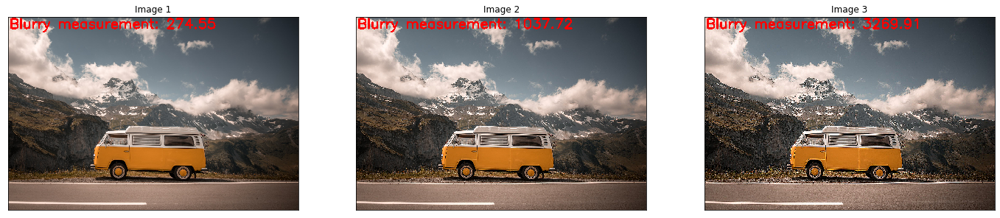

In [19]:
text = 'Blurry measurement'
text_filter = []
for i in range(len(enhanced_5x5)):
    fm = enhanced_measurement_5x5[i]
    filter_text = enhanced_5x5[i].putText('{}: {:.2f}'.format(text, fm), (10, 80), 
                                        fontFace = cv2.FONT_HERSHEY_SIMPLEX, 
                                        fontScale = 3, 
                                        color = (255, 0, 0), 
                                        thickness = 10
                                       )
    text_filter.append(filter_text)
showListImages(text_filter, rows = 1, cols = len(enhanced_5x5))

# Bài tập 03

# - Viết hàm đọc toàn bộ ảnh trong thư mục “Image_Input” đó vào một List ảnh 

# (đã cài đặt trong lớp Image)

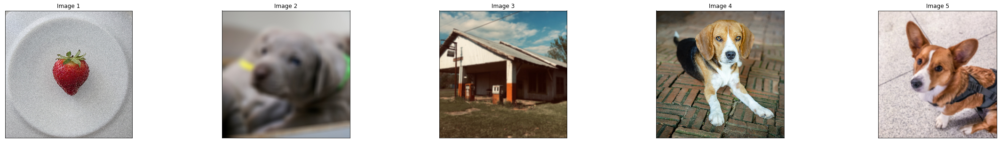

In [20]:
listImages = Image.fromDirectory('Image_Input')
showListImages(listImages, rows = 1, cols = 5)

# - Định nghĩa ngưỡng mờ dựa trên giá độ đo mờ

In [21]:
for i, image in enumerate(listImages):
    blurred_measurement = Image.blurryMeasurement(image)
    print(f'Image {i + 1}: {blurred_measurement}')

Image 1: 408.94592700954547
Image 2: 1.4420534034887216
Image 3: 3.558295349102254
Image 4: 49.703569411053955
Image 5: 3.1570214368759313


# - Đọc lần lượt các ảnh : nếu ảnh nào ngoài ngưỡng mờ ta ghi một dòng thông tin trên ảnh là “Blurred Image :” kèm giá trị mờ. Nếu ảnh nào tốt thì ta ghi “Good Image” trên ảnh

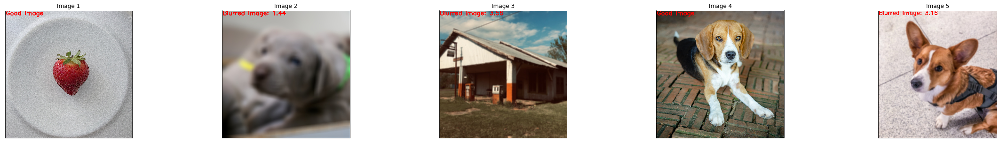

In [22]:
threshold = 40
resultImages = []
for i, image in enumerate(listImages):
    blurred_measurement = Image.blurryMeasurement(image)
    text = f'Blurred Image: {round(blurred_measurement, 2)}' if blurred_measurement < threshold else 'Good Image'
    result = image.putText(text, (10,70), fontScale = 3, thickness = 10)
    resultImages.append(result)
showListImages(resultImages, rows = 1, cols = 5)

# - Tất cả các ảnh sau khi đánh giá được lưu vào một thư mục “Image_BlurDetection_Output”

In [23]:
Image.toDirectory('Image_BlurDetection_Output', resultImages)

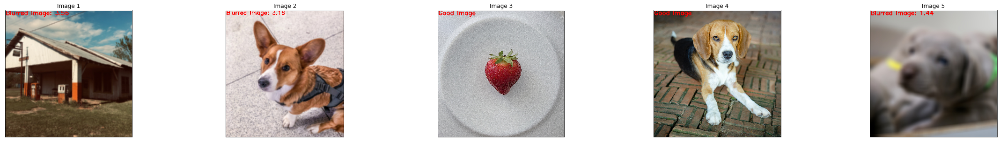

In [24]:
listImages = Image.fromDirectory('Image_BlurDetection_Output')
showListImages(listImages, rows = 1, cols = 5)

# Bài tập 04

In [25]:
def max_rgb_filter(image):
    (B, G, R) = cv2.split(image.image)
    maxRGB = np.maximum(np.maximum(R, G), B)
    R[R < maxRGB] = 0
    G[G < maxRGB] = 0
    B[B < maxRGB] = 0
    return Image(img = cv2.merge([B, G, R]))

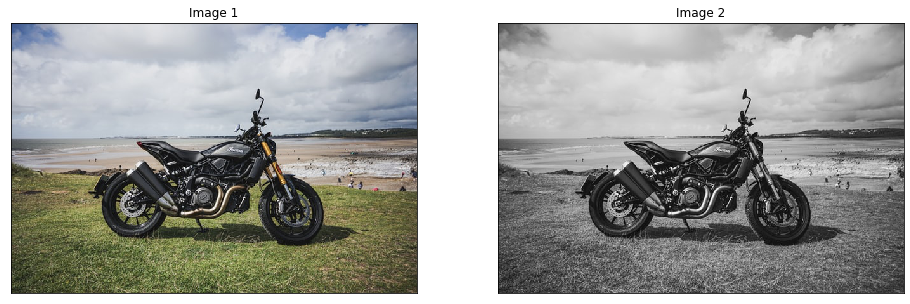

In [26]:
image_color = Image('motorcycle.jpg')
image_gray = image_color.convertColor(cv2.COLOR_RGB2GRAY)

showTwoImages(image_color, image_gray)

# - Xuất ảnh từng điểm ảnh hiển thị giá trị RGBMax

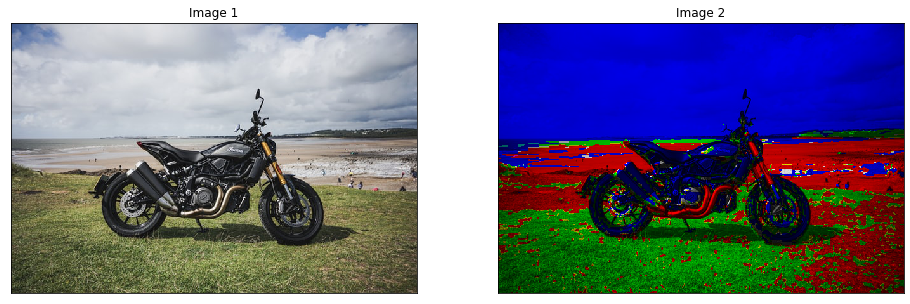

In [27]:
image_color_rgbmax = max_rgb_filter(image_color)
showTwoImages(image_color, image_color_rgbmax)

# - Xuất các vị trí có giá trị R đạt max, G đạt max và B đạt max

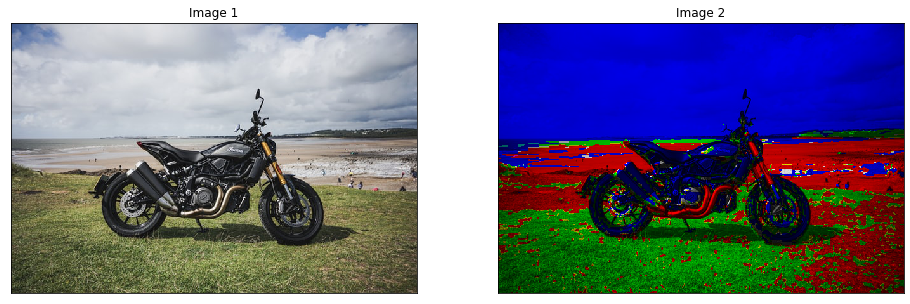

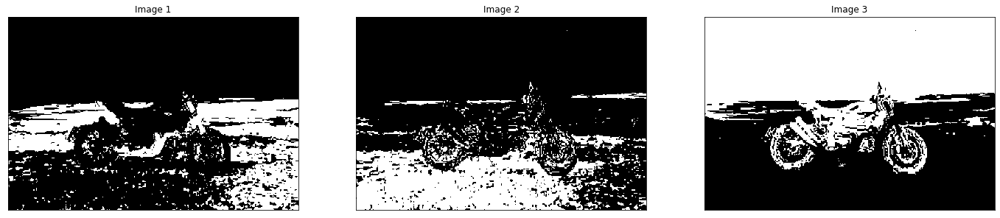

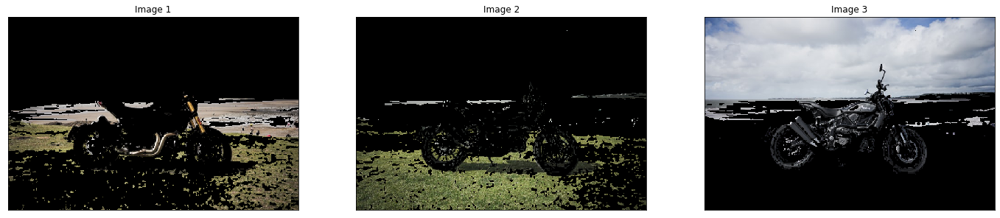

In [28]:
image_maxR_mask = Image(img = image_gray.image < 0)
image_maxG_mask = Image(img = image_gray.image < 0)
image_maxB_mask = Image(img = image_gray.image < 0)

R = image_color_rgbmax.image[:,:,0]
G = image_color_rgbmax.image[:,:,1]
B = image_color_rgbmax.image[:,:,2]

image_maxR_mask.image[(G == 0) & (B == 0)] = 1
image_maxG_mask.image[(R == 0) & (B == 0)] = 1
image_maxB_mask.image[(G == 0) & (R == 0)] = 1

image_max = []

for mask in [image_maxR_mask, image_maxG_mask, image_maxB_mask]:
    image_max.append(image_color.segmentByMask(mask))

showTwoImages(image_color, image_color_rgbmax)
showThreeImages(image_maxR_mask, image_maxG_mask, image_maxB_mask)
showListImages(image_max, rows = 1, cols = 3)

# - Thưc hiện làm mờ ảnh rồi sau đó làm rõ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không

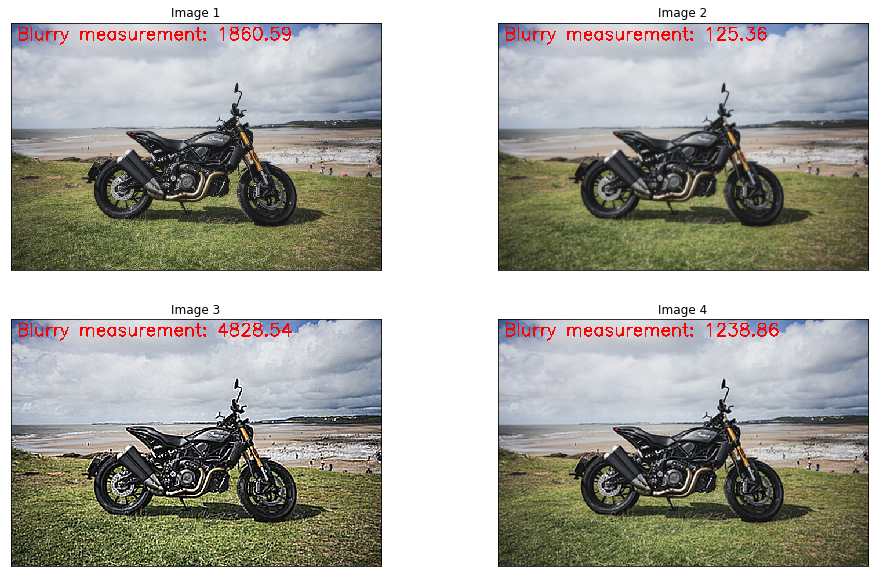

In [29]:
kernel_3x3 = np.ones((3,3),np.float32)/9
kernel_sharpen_01 = np.array([[-1,-1,-1],
                              [-1, 9,-1],
                              [-1,-1,-1]])
kernel_sharpen_02 = np.array([[0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]])

blurred_image = image_color.applyKernel(kernel_3x3)
sharpen_blurred_image_01 = blurred_image.applyKernel(kernel_sharpen_01)
sharpen_blurred_image_02 = blurred_image.applyKernel(kernel_sharpen_02)

listImages = [image_color, blurred_image, sharpen_blurred_image_01, sharpen_blurred_image_02]
length = len(listImages)

for i in range(length):
    image = listImages.pop(0)
    text = 'Blurry measurement'
    fm = Image.blurryMeasurement(image)
    copyImage = image.putText(
        '{}: {:.2f}'.format(text, fm), 
        (10, 30),  
        fontScale = 1,
        color = (255, 0, 0), 
        thickness = 2
    )
    listImages.append(copyImage)
showListImages(listImages, rows = 2, cols = 2)

# - Thực hiện làm rõ ảnh rồi sau đó làm mờ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không

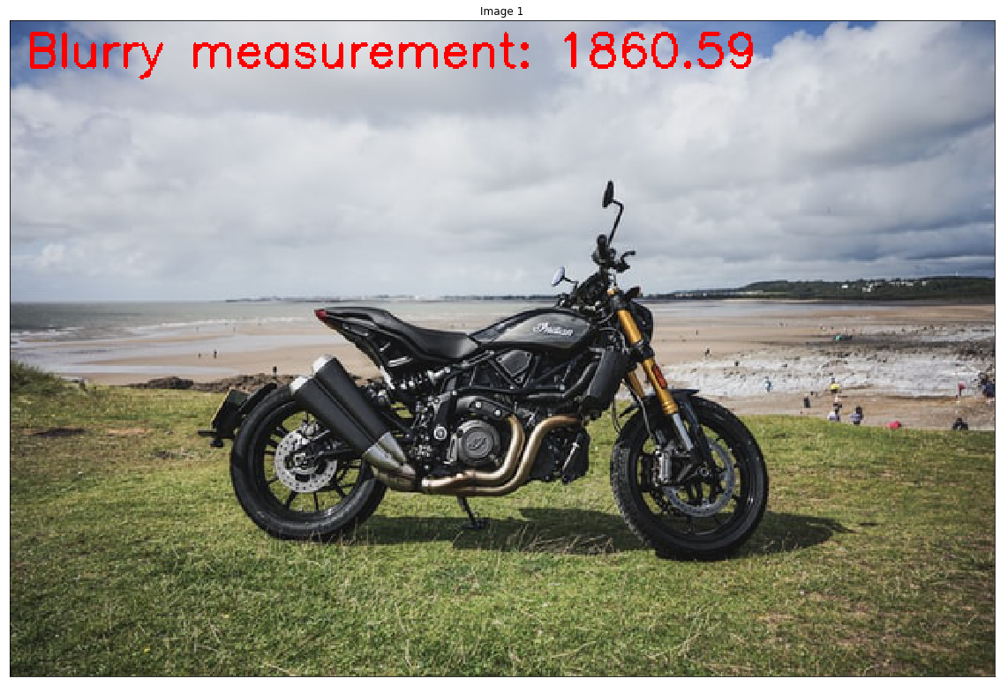

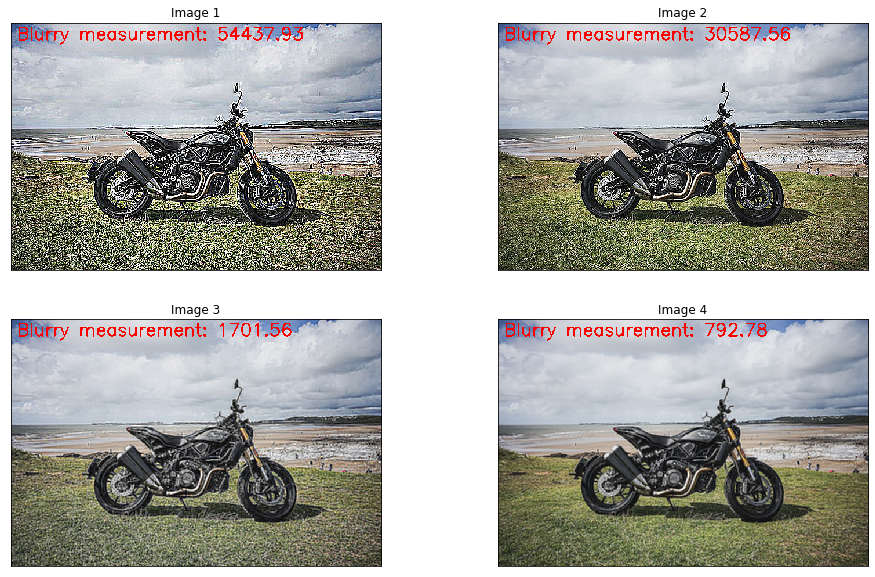

In [30]:
sharpen_image_01 = image_color.applyKernel(kernel_sharpen_01)
sharpen_image_02 = image_color.applyKernel(kernel_sharpen_02)
blurred_sharpen_image_01 = sharpen_image_01.applyKernel(kernel_3x3)
blurred_sharpen_image_02 = sharpen_image_02.applyKernel(kernel_3x3)

listImages = [image_color, sharpen_image_01, sharpen_image_02, blurred_sharpen_image_01, blurred_sharpen_image_02]
length = len(listImages)

for i in range(length):
    image = listImages.pop(0)
    text = 'Blurry measurement'
    fm = Image.blurryMeasurement(image)
    copyImage = image.putText(
        '{}: {:.2f}'.format(text, fm), 
        (10, 30),  
        fontScale = 1,
        color = (255, 0, 0), 
        thickness = 2
    )
    listImages.append(copyImage)

showOneImage(listImages[0])
showListImages(listImages[1:], rows = 2, cols = 2)

# - Tìm cạnh và tạo ra các ảnh về cạnh sau : ảnh cạnh ngang, cạnh dọc và ảnh cạnh tổng

In [31]:
kernel_sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")
kernel_sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

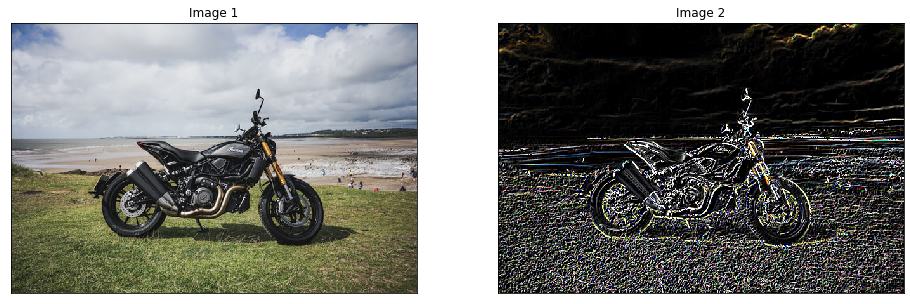

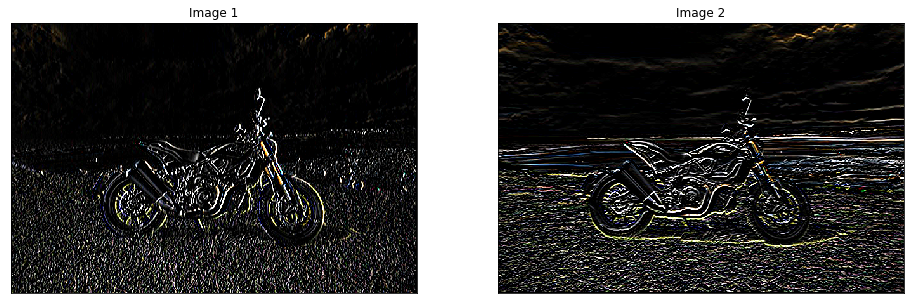

In [32]:
image_color_edge_sobelX = image_color.applyKernel(kernel_sobelX)
image_color_edge_sobelY = image_color.applyKernel(kernel_sobelY)
image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY
showTwoImages(image_color, image_color_edge)
showTwoImages(image_color_edge_sobelX, image_color_edge_sobelY)